# Project: Wrangling and Analyze Data

In [1]:
# Importing all necessary libraries
import pandas as pd
import requests
import tweepy
import json
from timeit import default_timer as timer
from tweepy import OAuthHandler
# For visualization
import matplotlib.pyplot as plt

# Importing the seperate python file with the API credentials (for a safety reason this file isn't included in the submission)
from twitter_credentials import *

# To print entire dataframes 
pd.set_option("display.max_rows", None, "display.max_columns", None)
# To print entire cells for for example description
pd.set_option("max_colwidth", 280) # The lenght was set to 280 because the tweets cannot have more than 280 characters
# This magic command will allow to display plots inside the Jupyter Notebook
%matplotlib inline

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.

1. Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

In [2]:
we_rate_dogs_df = pd.read_csv('./twitter-archive-enhanced.csv')
we_rate_dogs_df.head(2)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None


2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

In [4]:
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

# Save to file
with open("image_predictions.tsv", mode='wb') as file:
    file.write(response.content)

# Then I can read information stored in this file into the dataframe
image_prediction_df = pd.read_csv('./image_predictions.tsv', sep='\t')
image_prediction_df.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [5]:
# As I have troubles with Twitter API, I followed the informations provided in the project description and download provided 
# 'tweet-json' file 
tweet_df = pd.read_json('./tweet-json.txt', lines=True)
tweet_df.head()

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXo...","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'p...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4X...","{'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'url': 'https://t.co/0Xxu71qeIV', 'display_url': '...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 891815175371796480, 'id_str': '891815175371796480', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGBdLU1W...","{'media': [{'id': 891815175371796480, 'id_str': '891815175371796480', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'url': 'https://t.co/wUnZnhtVJB', 'display_url': '...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description':

## Assessing Data
In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.



### Visual asseement

In [6]:
we_rate_dogs_df

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643555336193/photo/1,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421306343426/photo/1,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181378084864/photo/1,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557279858688/photo/1,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>","This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",NaN,NaN,NaN,"https://twitter.com/dog_rates/status/891327558926688256/photo/1,https://twitter.com/dog_rates/status/891327558926688256/photo/1",12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950875897856/photo/1,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,https://twitter.com/dog_rates/status/890971913173991426/photo/1",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,NaN,NaN,NaN,"https://twitter.com/dog_rates/status/890729181411237888/photo/1,https://twitter.com/dog_rates/status/890729181411237888/photo/1",13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185150312448/photo/1,13,10,Zoey,None,None,None,None
9,89024025534

In [7]:
image_prediction_df

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,1.566650e-01,True,Shetland_sheepdog,6.142850e-02,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,7.419170e-02,True,Rhodesian_ridgeback,7.201000e-02,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,1.385840e-01,True,bloodhound,1.161970e-01,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,3.606870e-01,True,miniature_pinscher,2.227520e-01,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,2.436820e-01,True,Doberman,1.546290e-01,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,2.637880e-01,True,Greater_Swiss_Mountain_dog,1.619920e-02,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,4.588540e-02,False,terrapin,1.788530e-02,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,5.827940e-02,True,fur_coat,5.444860e-02,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,1.459380e-02,False,golden_retriever,7.958960e-03,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,1.923050e-01,True,soft-coated_wheaten_terrier,8.208610e-02,True


In [8]:
tweet_df

,created_at,id,id_str,full_text,truncated,display_text_range,entities,extended_entities,source,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,user,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,possibly_sensitive_appealable,lang,retweeted_status,quoted_status_id,quoted_status_id_str,quoted_status
0,2017-08-01 16:23:56+00:00,892420643555336193,892420643555336192,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,False,"[0, 85]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXo...","{'media': [{'id': 892420639486877696, 'id_str': '892420639486877696', 'indices': [86, 109], 'media_url': 'http://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg', 'url': 'https://t.co/MgUWQ76dJU', 'display_url': 'p...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame...",NaN,NaN,None,NaN,False,8853,39467,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
1,2017-08-01 00:17:27+00:00,892177421306343426,892177421306343424,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",False,"[0, 138]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4X...","{'media': [{'id': 892177413194625024, 'id_str': '892177413194625024', 'indices': [139, 162], 'media_url': 'http://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg', 'url': 'https://t.co/0Xxu71qeIV', 'display_url': '...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description': '#1 Source for Professional Dog Ratings | STORE: @ShopWeRateDogs | IG, FB & SC: WeRateDogs MOBILE APP: @GoodDogsGame...",NaN,NaN,None,NaN,False,6514,33819,False,False,0.0,0.0,en,NaN,NaN,NaN,NaN
2,2017-07-31 00:18:03+00:00,891815181378084864,891815181378084864,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,False,"[0, 121]","{'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 891815175371796480, 'id_str': '891815175371796480', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGBdLU1W...","{'media': [{'id': 891815175371796480, 'id_str': '891815175371796480', 'indices': [122, 145], 'media_url': 'http://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'media_url_https': 'https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg', 'url': 'https://t.co/wUnZnhtVJB', 'display_url': '...","<a href=""http://twitter.com/download/iphone"" rel=""nofollow"">Twitter for iPhone</a>",NaN,NaN,NaN,NaN,None,"{'id': 4196983835, 'id_str': '4196983835', 'name': 'WeRateDogs™ (author)', 'screen_name': 'dog_rates', 'location': 'DM YOUR DOGS, WE WILL RATE', 'description':

### Programmatic asseement

In [9]:
# Explore more closely `rating_numerator` and `rating_denominator` column to see if there are some weird looking values
we_rate_dogs_df.groupby('rating_numerator')['tweet_id'].nunique()

rating_numerator
0         2
1         9
2         9
3        19
4        17
5        37
6        32
7        55
8       102
9       158
10      461
11      464
12      558
13      351
14       54
15        2
17        1
20        1
24        1
26        1
27        1
44        1
45        1
50        1
60        1
75        2
80        1
84        1
88        1
99        1
121       1
143       1
144       1
165       1
182       1
204       1
420       2
666       1
960       1
1776      1
Name: tweet_id, dtype: int64

There are some numerator which looks suspicious for me. They are 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 15, 17, 20, 24, 26, 27, 44, 45, 50, 60, 75, 80, 84, 88, 99, 121, 143, 165, 182, 204, 420, 666, 960, 1776.
<br> So, I will print rows with those numerator values to visually see if those value are correct.

In [10]:
numerator_list = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 15, 17, 20, 24, 26, 27, 44, 45, 50, 60, 75, 80, 84, 88, 99, 121, 143, 165, 
                  182, 204, 420, 666, 960, 1776]
numerator_df = we_rate_dogs_df[we_rate_dogs_df['rating_numerator'].isin(numerator_list)]
numerator_df[['tweet_id', 'text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
45,883482846933004288,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",5,10
55,881633300179243008,@roushfenway These are good dogs but 17/10 is an emotional impulse rating. More like 13/10s,17,10
188,855862651834028034,@dhmontgomery We also gave snoop dogg a 420/10 but I think that predated your research,420,10
189,855860136149123072,"@s8n You tried very hard to portray this good boy as not so good, but you have ultimately failed. His goodness shines through. 666/10",666,10
229,848212111729840128,"This is Jerry. He's doing a distinguished tongue slip. Slightly patronizing tbh. You think you're better than us, Jerry? 6/10 hold me back https://t.co/DkOBbwulw1",6,10
285,838916489579200512,RT @KibaDva: I collected all the good dogs!! 15/10 @dog_rates #GoodDogs https://t.co/6UCGFczlOI,15,10
290,838150277551247360,@markhoppus 182/10,182,10
291,838085839343206401,@bragg6of8 @Andy_Pace_ we are still looking for the first 15/10,15,10
313,835246439529840640,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",960,0
315,835152434251116546,When you're so blinded by your systematic plagiarism that you forget what day it is. 0/10 https://t.co/YbEJPkg4Ag,0,10


There are some records with wrong nominator. For `tweet_id`:
* 883482846933004288: should be 13.5/10 is 5
* 835246439529840640: should be 13 is 960
* 832215909146226688: should be 9.75 is 75
* 786709082849828864: should be 9.75 is 75
* 778027034220126208: should be 11.27 is 27
* 716439118184652801: should be 11 is 50
* 681340665377193984: should be 9.5 is 5
* 680494726643068929: should be 11.26 is 10
* 667550882905632768: should be -5 is 5
* 666287406224695296: should be 9 is 1

In [11]:
# The same for `rating_denominator` column
we_rate_dogs_df.groupby('rating_denominator')['tweet_id'].nunique()

rating_denominator
0         1
2         1
7         1
10     2333
11        3
15        1
16        1
20        2
40        1
50        3
70        1
80        2
90        1
110       1
120       1
130       1
150       1
170       1
Name: tweet_id, dtype: int64

There are some numerator which looks suspicious for me. They are 0, 2, 7, 11, 15, 16, 20, 40, 50, 70, 80, 90, 110, 120, 130, 150, 170.
<br> So, I will print rows with those numerator values to visually see if those value are correct.

In [12]:
denominator_list = [0, 2, 7, 11, 15, 16, 20, 40, 50, 70, 80, 90, 110, 120, 130, 150, 170]
denominator_df = we_rate_dogs_df[we_rate_dogs_df['rating_denominator'].isin(numerator_list)]
denominator_df[['tweet_id', 'text', 'rating_numerator', 'rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
313,835246439529840640,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",960,0
342,832088576586297345,@docmisterio account started on 11/15/15,11,15
516,810984652412424192,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24,7
1165,722974582966214656,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,4,20
1202,716439118184652801,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50,50
1254,710658690886586372,Here's a brigade of puppers. All look very prepared for whatever happens next. 80/80 https://t.co/0eb7R1Om12,80,80
1274,709198395643068416,"From left to right:\nCletus, Jerome, Alejandro, Burp, &amp; Titson\nNone know where camera is. 45/50 would hug all at once https://t.co/sedre1ivTK",45,50
1351,704054845121142784,Here is a whole flock of puppers. 60/50 I'll take the lot https://t.co/9dpcw6MdWa,60,50
1598,686035780142297088,"Yes I do realize a rating of 4/20 would've been fitting. However, it would be unjust to give these cooperative pups that low of a rating",4,20
1843,675853064436391936,Here we have an entire platoon of puppers. Total score: 88/80 would pet all at once https://t.co/y93p6FLvVw,88,80


There are some records with wrong denominator. For `tweet_id`:
* 835246439529840640: should be 10 is 0
* 832088576586297345: the numbers there '11/15/15' seems to be a date not a dog rating
* 810984652412424192: there isn't any ratings in this tweet. The number there 24/7 refered to the rating by 24h 7 days a week
* 716439118184652801: should be 10 is 50
* 666287406224695296: should be 10 is 2

In [13]:
we_rate_dogs_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

In [14]:
# Further investigate timestamp column
type(we_rate_dogs_df['timestamp'][0])

str

In [15]:
type(we_rate_dogs_df['retweeted_status_timestamp'][0])

float

In [16]:
# Checking for duplicates tweet_id
sum(we_rate_dogs_df['tweet_id'].duplicated())

0

There aren't any duplicated tweets in `we_rate_dogs_df`

In [17]:
image_prediction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


The data formats seems to be ok for `image_prediction_df`.

In [18]:
# Checking for duplicates tweet_id
sum(image_prediction_df['tweet_id'].duplicated())

0

There aren't any duplicated tweets in also in `image_prediction_df`.

In [19]:
tweet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2354 entries, 0 to 2353
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype              
---  ------                         --------------  -----              
 0   created_at                     2354 non-null   datetime64[ns, UTC]
 1   id                             2354 non-null   int64              
 2   id_str                         2354 non-null   int64              
 3   full_text                      2354 non-null   object             
 4   truncated                      2354 non-null   bool               
 5   display_text_range             2354 non-null   object             
 6   entities                       2354 non-null   object             
 7   extended_entities              2073 non-null   object             
 8   source                         2354 non-null   object             
 9   in_reply_to_status_id          78 non-null     float64            
 10  in_reply_to_status_id_st

All necessary columns (`tweet_id`, `retweet_count`, `favorite_count`) have good format

In [20]:
# Checking for duplicates tweet_id
sum(tweet_df['id'].duplicated())

0

There aren't any duplicated tweets in also in `tweet_df`.

### Quality issues
1. `we_rate_dogs_df`: only original tweets should be kept (the record for the retweets should be dropped) 

2. `we_rate_dogs_df`: incorect dogs names like: such, quite, a etc

3. `we_rate_dogs_df`: only columns needed for the analysis should be kept (getting rid of all not necessary columns)

4. `we_rate_dogs_df`: wrong values in the `rating_numerator` and `rating_denominator` columns (more info about which records it concern is placed above)

5. `we_rate_dogs_df`: timestamp column are of type string (for `timestamp`) rather than date time format

6. `tweet_df`: this dataframe should contain only retweet count and favorite ("like") count about each tweet (according to project description)

7. `image_prediction_df`: in `p1`, `p2`, `p3` columns some of the breed of dogs names are inconsistent (some are lowercase, some words are splitted by underscore, some others by dash)

8. `we_rate_dogs_df` and `tweet_df`: contain records with tweets without the photos

### Tidiness issues

1. `image_prediction_df`: the information from different predictions should be splitted into three different data frames (plus one additional dataframe to store the information about `jpg_url` and `jpg_number`). `tweet_id` should be used as a connector between those dataframes.

2. `we_rate_dogs_df`: `doggo`, `floofer`, `pupper`, `puppo` should be represent as one column 

## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [21]:
# Make copies of original pieces of data
we_rate_dogs_clean = we_rate_dogs_df.copy()
image_prediction_clean = image_prediction_df.copy()
tweet_clean = tweet_df.copy()

### Issue #1: 

#### Define:
Only original tweets should be kept. All of the records which have `in_reply_to_status_id` which is not NaN should be removed using df.drop().

#### Code

In [22]:
indexes = we_rate_dogs_clean[we_rate_dogs_clean['in_reply_to_status_id'].isnull()==False].index
we_rate_dogs_clean.drop(indexes, axis=0, inplace=True)

#### Test

In [23]:
we_rate_dogs_clean['in_reply_to_status_id'].unique()

array([nan])

### Issue #2:

#### Define
`we_rate_dogs_df` and `tweet_df`: contain records with tweets without the photos.
<br>In `we_rate_dogs_df` data frame tweets with photos have `expanded_urls` which follows this pattern 'https://twitter.com/dog_rates/status/{tweet_id}/photo/{photo_number}'. So only recors which `expanded_urls` follows this pattern to receive only tweets with photos. 
<br>To select only tweets with photos from `tweet_df`, the only thing that has to done is to select the tweets with ids present in `we_rate_dogs_df` (`we_rate_dogs_df` have to be after removing the tweets without the photo).

#### Code

In [24]:
# `we_rate_dogs_df` dataframe

# we_rate_dogs_clean = we_rate_dogs_clean[we_rate_dogs_clean['expanded_urls'].str.contains('https:\/\/twitter.com\/dog_rates\/status\/[0-9]+\/photo')]

# In case when 'expanded_urls' value is NaN the result of this part of the above query 
# we_rate_dogs_clean['expanded_urls'].str.contains('https:\/\/twitter.com\/dog_rates\/status\/[0-9]+\/photo') will be also a NaN
# and this will be causing an error. So I have to replace NaN values with False firstly
we_rate_dogs_clean['expanded_urls'] = we_rate_dogs_clean['expanded_urls'].fillna('False')
we_rate_dogs_clean = we_rate_dogs_clean[we_rate_dogs_clean['expanded_urls'].str.contains('https:\/\/twitter.com\/dog_rates\/status\/[0-9]+\/photo')]

In [25]:
# `tweet_df` dataframe
tweet_list = we_rate_dogs_clean['tweet_id'].to_list()
tweet_clean =  tweet_clean[tweet_clean['id'].isin(tweet_list)]

#### Test

In [26]:
sum(~we_rate_dogs_clean['expanded_urls'].str.contains('https:\/\/twitter.com\/dog_rates\/status\/[0-9]+\/photo'))

0

### Issue #3:

#### Define
`we_rate_dogs_df`: incorect dogs names in `name` column

#### Code

In [27]:
# Here I further investigate this problem (identifies in visual assesement part) to check what names are wrong
we_rate_dogs_df.groupby('name')['tweet_id'].nunique()

name
Abby                2
Ace                 1
Acro                1
Adele               1
Aiden               1
Aja                 1
Akumi               1
Al                  1
Albert              2
Albus               2
Aldrick             1
Alejandro           1
Alexander           1
Alexanderson        1
Alf                 1
Alfie               5
Alfy                1
Alice               2
Amber               1
Ambrose             1
Amy                 1
Amélie              1
Anakin              2
Andru               1
Andy                1
Angel               1
Anna                1
Anthony             1
Antony              1
Apollo              1
Aqua                1
Archie              4
Arlen               1
Arlo                1
Arnie               3
Arnold              1
Arya                1
Ash                 2
Asher               1
Ashleigh            1
Aspen               2
Astrid              2
Atlas               2
Atticus             2
Aubie               1
Augie

After checking the names in the `we_rate_dogs_df` the following names where identified as not a dogs names and they should be raplaces by None (like others records without dogs name):
O, a, actually, all, an , by, getting, his, incredibly, infuriating, just, life, light, mad, my, not, officially, old, one,
quite, space, such, the this, unacceptable, very

In [28]:
not_names_list = ['O', 'a', 'actually', 'all', 'an', 'by', 'getting', 'his', 'incredibly', 'infuriating', 'just', 
                  'life', 'light', 'mad', 'my', 'not', 'officially', 'old', 'one', 'quite', 'space', 'such', 'the', 
                  'this', 'unacceptable', 'very']

we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['name'].isin(not_names_list)].index, 'name'] = 'None'

#### Test

In [29]:
we_rate_dogs_clean.groupby('name')['tweet_id'].nunique()

name
Abby                2
Ace                 1
Acro                1
Adele               1
Aiden               1
Aja                 1
Akumi               1
Al                  1
Albert              2
Albus               2
Aldrick             1
Alejandro           1
Alexander           1
Alexanderson        1
Alf                 1
Alfie               5
Alfy                1
Alice               2
Amber               1
Ambrose             1
Amy                 1
Amélie              1
Anakin              2
Andru               1
Andy                1
Angel               1
Anna                1
Anthony             1
Antony              1
Apollo              1
Aqua                1
Archie              4
Arlen               1
Arlo                1
Arnie               2
Arnold              1
Arya                1
Ash                 2
Asher               1
Ashleigh            1
Aspen               2
Astrid              2
Atlas               2
Atticus             2
Aubie               1
Augie

### Issue #4:

#### Define
`we_rate_dogs_df`: only columns needed for the analysis should be kept (getting rid of all not necessary columns).
Drop `in_reply_to_status_id`, `in_reply_to_user_id`, `source`, `retweeted_status_id`, `retweeted_status_user_id`, `retweeted_status_timestamp`, `expanded_urls`.

#### Code

In [30]:
we_rate_dogs_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'source', 'retweeted_status_id',
                        'retweeted_status_user_id', 'retweeted_status_timestamp', 'expanded_urls'], axis=1, inplace=True)

#### Test

In [31]:
we_rate_dogs_clean.head()

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,2017-08-01 16:23:56 +0000,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13,10,Phineas,None,None,None,None
1,892177421306343426,2017-08-01 00:17:27 +0000,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13,10,Tilly,None,None,None,None
2,891815181378084864,2017-07-31 00:18:03 +0000,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12,10,Archie,None,None,None,None
3,891689557279858688,2017-07-30 15:58:51 +0000,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13,10,Darla,None,None,None,None
4,891327558926688256,2017-07-29 16:00:24 +0000,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12,10,Franklin,None,None,None,None


### Issue #5:

#### Define
`we_rate_dogs_df`: wrong values in the `rating_numerator` and `rating_denominator` columns (more info about which records it concern is placed above). The wrong values have to be changed for a good one.
<br>For the nominator:
* 883482846933004288: should be 13.5/10 is 5
* 835246439529840640: should be 13 is 960
* 832215909146226688: should be 9.75 is 75
* 786709082849828864: should be 9.75 is 75
* 778027034220126208: should be 11.27 is 27
* 716439118184652801: should be 11 is 50
* 681340665377193984: should be 9.5 is 5
* 680494726643068929: should be 11.26 is 10
* 667550882905632768: should be -5 is 5
* 666287406224695296: should be 9 is 1

<br>For the denominator:
* 835246439529840640: should be 10 is 0
* 832088576586297345: the numbers there '11/15/15' seems to be a date not a dog rating
* 810984652412424192: there isn't any ratings in this tweet. The number there 24/7 refered to the rating by 24h 7 days a week
* 716439118184652801: should be 10 is 50
* 666287406224695296: should be 10 is 2

#### Code

In [32]:
# But firsly before updating values for nominator and denominator, the type of those two columns have to changed. Now they are
# int, should be float
we_rate_dogs_clean['rating_numerator'] = we_rate_dogs_clean['rating_numerator'].astype(float)
we_rate_dogs_clean['rating_denominator'] = we_rate_dogs_clean['rating_denominator'].astype(float)

In [33]:
# Now the values for the above tweets can be updated
# Updating numerator
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 883482846933004288].index, 'rating_numerator'] = 13.5
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 835246439529840640].index, 'rating_numerator'] = 13
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 832215909146226688].index, 'rating_numerator'] = 9.75
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 786709082849828864].index, 'rating_numerator'] = 9.75
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 778027034220126208].index, 'rating_numerator'] = 11.27
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 716439118184652801].index, 'rating_numerator'] = 11
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 681340665377193984].index, 'rating_numerator'] = 9.5
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 680494726643068929].index, 'rating_numerator'] = 11.26      
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 667550882905632768].index, 'rating_numerator'] = -5
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 666287406224695296].index, 'rating_numerator'] = 9    

In [34]:
# Updating denominator
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 835246439529840640].index, 'rating_denominator'] = 10
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 716439118184652801].index, 'rating_denominator'] = 10
we_rate_dogs_clean.loc[we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 666287406224695296].index, 'rating_denominator'] = 10

In [35]:
# For tweet 810984652412424192 it seems that there aren't any rating 24/7 refered to 24h 7 days a week
# So those values have to deleted
idx = we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'] == 810984652412424192].index
we_rate_dogs_clean.drop(idx, axis=0, inplace=True)

#### Test

In [36]:
tweet_list = [883482846933004288, 835246439529840640, 832215909146226688, 786709082849828864, 778027034220126208,
              716439118184652801, 681340665377193984, 680494726643068929, 667550882905632768, 666287406224695296,
              835246439529840640, 716439118184652801, 666287406224695296, 810984652412424192]

we_rate_dogs_clean[we_rate_dogs_clean['tweet_id'].isin(tweet_list)]

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
45,883482846933004288,2017-07-08 00:28:19 +0000,"This is Bella. She hopes her smile made you smile. If not, she is also offering you her favorite monkey. 13.5/10 https://t.co/qjrljjt948",13.50,10.0,Bella,None,None,None,None
340,832215909146226688,2017-02-16 13:11:49 +0000,"RT @dog_rates: This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wu…",9.75,10.0,Logan,None,None,None,None
695,786709082849828864,2016-10-13 23:23:56 +0000,"This is Logan, the Chow who lived. He solemnly swears he's up to lots of good. H*ckin magical af 9.75/10 https://t.co/yBO5wuqaPS",9.75,10.0,Logan,None,None,None,None
763,778027034220126208,2016-09-20 00:24:34 +0000,This is Sophie. She's a Jubilant Bush Pupper. Super h*ckin rare. Appears at random just to smile at the locals. 11.27/10 would smile back https://t.co/QFaUiIHxHq,11.27,10.0,Sophie,None,None,pupper,None
1202,716439118184652801,2016-04-03 01:36:11 +0000,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,11.00,10.0,Bluebert,None,None,None,None
1712,680494726643068929,2015-12-25 21:06:00 +0000,Here we have uncovered an entire battalion of holiday puppers. Average of 11.26/10 https://t.co/eNm2S6p9BD,11.26,10.0,None,None,None,None,None
2335,666287406224695296,2015-11-16 16:11:11 +0000,This is an Albanian 3 1/2 legged Episcopalian. Loves well-polished hardwood flooring. Penis on the collar. 9/10 https://t.co/d9NcXFKwLv,9.00,10.0,None,None,None,None,None


### Issue #6:

#### Define
`we_rate_dogs_df`: timestamp column are of type string (for `timestamp`) rather than date time format.
<br> The format of this column needs to changed using adtype

#### Code

In [37]:
we_rate_dogs_clean['timestamp'] = we_rate_dogs_clean['timestamp'].astype('datetime64[ns]')

#### Test

In [38]:
we_rate_dogs_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2034 entries, 0 to 2355
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   tweet_id            2034 non-null   int64         
 1   timestamp           2034 non-null   datetime64[ns]
 2   text                2034 non-null   object        
 3   rating_numerator    2034 non-null   float64       
 4   rating_denominator  2034 non-null   float64       
 5   name                2034 non-null   object        
 6   doggo               2034 non-null   object        
 7   floofer             2034 non-null   object        
 8   pupper              2034 non-null   object        
 9   puppo               2034 non-null   object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(6)
memory usage: 174.8+ KB


### Issue #7:

#### Define
`tweet_df`: this dataframe should contain only retweet count and favorite ("like") count about each tweet (according to project description).
<br>From tweet_df only columns `id`, `retweet_count` and `favorite_count` should be selected. It will be good to rename id column to tweet_id, just to keep the consistent names for tweet id with other dataframes

#### Code

In [39]:
tweet_clean = tweet_df[['id', 'retweet_count', 'favorite_count']]
tweet_clean = tweet_clean.rename(columns={'id':'tweet_id'})

#### Test

In [40]:
tweet_clean.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,8853,39467
1,892177421306343426,6514,33819
2,891815181378084864,4328,25461
3,891689557279858688,8964,42908
4,891327558926688256,9774,41048


### Issue #8:

#### Define
`image_prediction_df`: in `p1`, `p2`, `p3` columns some of the breed of dogs names are inconsistent (some are lowercase, some words are splitted by underscore, some others by dash).
<br>The underscores and dashes should be replaced by space and names should be represented as lowercase

#### Code

In [41]:
columns = ['p1', 'p2', 'p3']
for column in columns:
    image_prediction_clean[column] = image_prediction_clean[column].str.replace('_', ' ').replace('-', ' ').str.lower()

#### Test

In [42]:
image_prediction_clean.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,welsh springer spaniel,0.465074,True,collie,0.156665,True,shetland sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature pinscher,0.074192,True,rhodesian ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,german shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,rhodesian ridgeback,0.408143,True,redbone,0.360687,True,miniature pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature pinscher,0.560311,True,rottweiler,0.243682,True,doberman,0.154629,True


### Issue #9:

#### Define
`image_prediction_df`: the information from different predictions should be splitted into three different data frames. `tweet_id` should be used as a connector between those dataframes. The information about image url and image number isn't important in the scope of this analysis so it can be omitted.

#### Code

In [43]:
image_prediction_p1 = image_prediction_clean[['tweet_id', 'p1', 'p1_conf', 'p1_dog']]
image_prediction_p2 = image_prediction_clean[['tweet_id', 'p2', 'p2_conf', 'p2_dog']]
image_prediction_p3 = image_prediction_clean[['tweet_id', 'p3', 'p3_conf', 'p3_dog']]

#### Test

In [44]:
image_prediction_p1.head()

,tweet_id,p1,p1_conf,p1_dog
0,666020888022790149,welsh springer spaniel,0.465074,True
1,666029285002620928,redbone,0.506826,True
2,666033412701032449,german shepherd,0.596461,True
3,666044226329800704,rhodesian ridgeback,0.408143,True
4,666049248165822465,miniature pinscher,0.560311,True


In [45]:
image_prediction_p2.head()

,tweet_id,p2,p2_conf,p2_dog
0,666020888022790149,collie,0.156665,True
1,666029285002620928,miniature pinscher,0.074192,True
2,666033412701032449,malinois,0.138584,True
3,666044226329800704,redbone,0.360687,True
4,666049248165822465,rottweiler,0.243682,True


In [46]:
image_prediction_p3.head()

,tweet_id,p3,p3_conf,p3_dog
0,666020888022790149,shetland sheepdog,0.061428,True
1,666029285002620928,rhodesian ridgeback,0.072010,True
2,666033412701032449,bloodhound,0.116197,True
3,666044226329800704,miniature pinscher,0.222752,True
4,666049248165822465,doberman,0.154629,True


### Issue #10:

#### Define
`we_rate_dogs_df`: `doggo`, `floofer`, `pupper`, `puppo` should be represent as one column 

#### Code

In [47]:
# Combining 4 columns
we_rate_dogs_clean['dog_type'] = we_rate_dogs_clean['doggo'] + we_rate_dogs_clean['floofer'] + we_rate_dogs_clean['pupper'] + we_rate_dogs_clean['puppo']

In [48]:
# Removing the `doggo`, `floofer`, `pupper`, `puppo` columns
we_rate_dogs_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis=1, inplace=True)

In [49]:
# Replacing combined values with not repeated one
# For example: 'NoneNoneNoneNone' should be replaced with 'None'
we_rate_dogs_clean['dog_type'].unique()

array(['NoneNoneNoneNone', 'doggoNoneNoneNone', 'NoneNoneNonepuppo',
       'NoneNonepupperNone', 'NoneflooferNoneNone', 'doggoNoneNonepuppo',
       'doggoflooferNoneNone', 'doggoNonepupperNone'], dtype=object)

In [50]:
dog_type_dict = {
    'NoneNoneNoneNone':'None',
    'doggoNoneNoneNone':'doggo',
    'NoneNoneNonepuppo':'puppo',
    'NoneNonepupperNone':'pupper',
    'NoneflooferNoneNone':'floofer',
    'doggoNoneNonepuppo':'doggo, puppo',
    'doggoflooferNoneNone':'doggo, floofer',
    'doggoNonepupperNone':'doggo, pupper'
}

we_rate_dogs_clean = we_rate_dogs_clean.replace({'dog_type': dog_type_dict})

#### Test

In [51]:
we_rate_dogs_clean.head(50)

,tweet_id,timestamp,text,rating_numerator,rating_denominator,name,dog_type
0,892420643555336193,2017-08-01 16:23:56,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,None
1,892177421306343426,2017-08-01 00:17:27,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,None
2,891815181378084864,2017-07-31 00:18:03,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12.0,10.0,Archie,None
3,891689557279858688,2017-07-30 15:58:51,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13.0,10.0,Darla,None
4,891327558926688256,2017-07-29 16:00:24,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12.0,10.0,Franklin,None
5,891087950875897856,2017-07-29 00:08:17,Here we have a majestic great white breaching off South Africa's coast. Absolutely h*ckin breathtaking. 13/10 (IG: tucker_marlo) #BarkWeek https://t.co/kQ04fDDRmh,13.0,10.0,None,None
6,890971913173991426,2017-07-28 16:27:12,Meet Jax. He enjoys ice cream so much he gets nervous around it. 13/10 help Jax enjoy more things by clicking below\n\nhttps://t.co/Zr4hWfAs1H https://t.co/tVJBRMnhxl,13.0,10.0,Jax,None
7,890729181411237888,2017-07-28 00:22:40,When you watch your owner call another dog a good boy but then they turn back to you and say you're a great boy. 13/10 https://t.co/v0nONBcwxq,13.0,10.0,None,None
8,890609185150312448,2017-07-27 16:25:51,This is Zoey. She doesn't want to be one of the scary sharks. Just wants to be a snuggly pettable boatpet. 13/10 #BarkWeek https://t.co/9TwLuAGH0b,13.0,10.0,Zoey,None
9,890240255349198849,2017-07-26 15:59:51,This is Cassie. She is a college pup. Studying international doggo communication and stick theory. 14/10 so elegant much sophisticate https://t.co/t1bfwz5S2A,14.0,10.0,Cassie,doggo


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".
<br>The others dataframes also will be saved to files.

In [52]:
# `we_rate_dogs_clean` dataframe
we_rate_dogs_clean.to_csv('./twitter_archive_master.csv', index=False)

In [53]:
# `image_prediction_p1` dataframe
image_prediction_p1.to_csv('./image_prediction_1.csv', index=False)

In [54]:
# `image_prediction_p2` dataframe
image_prediction_p2.to_csv('./image_prediction_2.csv', index=False)

In [55]:
# `image_prediction_p3` dataframe
image_prediction_p3.to_csv('./image_prediction_3.csv', index=False)

In [56]:
# `tweet_clean` dataframe
tweet_clean.to_csv('./tweet_info_clean.csv', index=False)

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

***Is some breed of dogs more popular then the others (receive more likes and retweets)?***
<br>For this one I will take the information stored in image prediction dataframe and used the prediction made by first algorithm (because it have the highest confidence). As a breed I will take those which have `p1_dog = True`

In [57]:
dogs_breed = image_prediction_p1.query('p1_dog == True')
dogs_breed.head()

,tweet_id,p1,p1_conf,p1_dog
0,666020888022790149,welsh springer spaniel,0.465074,True
1,666029285002620928,redbone,0.506826,True
2,666033412701032449,german shepherd,0.596461,True
3,666044226329800704,rhodesian ridgeback,0.408143,True
4,666049248165822465,miniature pinscher,0.560311,True


In [58]:
# Merging this information with the information about retweets and likes
breed_popularity = pd.merge(left=dogs_breed, right=tweet_clean, on='tweet_id')
breed_popularity.head()

,tweet_id,p1,p1_conf,p1_dog,retweet_count,favorite_count
0,666020888022790149,welsh springer spaniel,0.465074,True,532,2535
1,666029285002620928,redbone,0.506826,True,48,132
2,666033412701032449,german shepherd,0.596461,True,47,128
3,666044226329800704,rhodesian ridgeback,0.408143,True,147,311
4,666049248165822465,miniature pinscher,0.560311,True,41,111


In [59]:
popularity_results = breed_popularity.groupby('p1')[['retweet_count', 'favorite_count']].mean()
popularity_results['retweet+favorite'] = popularity_results['retweet_count'] + popularity_results['favorite_count']
popularity_results = popularity_results.sort_values(['retweet+favorite'],ascending=False)
popularity_results.head()

,retweet_count,favorite_count,retweet+favorite
p1,,,
saluki,5133.750000,24060.000,29193.750000
standard poodle,11081.375000,13812.750,24894.125000
french bulldog,4683.923077,17913.000,22596.923077
flat-coated retriever,4520.250000,16791.625,21311.875000
black-and-tan coonhound,4164.500000,17012.000,21176.500000


In [60]:
popularity_results.tail()

,retweet_count,favorite_count,retweet+favorite
p1,,,
tibetan terrier,557.750000,1841.000000,2398.750000
groenendael,413.000000,1896.000000,2309.000000
japanese spaniel,471.000000,1362.000000,1833.000000
ibizan hound,431.000000,1114.666667,1545.666667
brabancon griffon,287.666667,885.000000,1172.666667


***Is there any relantionship between the given rating and the tweet popularity (retweets and 'liekes')?***

In [62]:
relationship = pd.merge(left=we_rate_dogs_clean, right=tweet_clean, on='tweet_id')
relationship['rating'] = relationship['rating_numerator']/relationship['rating_denominator']
relationship = relationship[['tweet_id', 'rating', 'retweet_count', 'favorite_count']]
relationship.head()

,tweet_id,rating,retweet_count,favorite_count
0,892420643555336193,1.3,8853,39467
1,892177421306343426,1.3,6514,33819
2,891815181378084864,1.2,4328,25461
3,891689557279858688,1.3,8964,42908
4,891327558926688256,1.2,9774,41048


In [63]:
# Correlation between rating and retweet_count
correlation_retweet = relationship['rating'].corr(relationship['retweet_count'])
correlation_retweet

0.01911096041955667

It seems that there isn't any correlation between rating and number of retweets. (This will be visualize in the last section of the notebook).

In [64]:
# Correlation between rating and favorite_count
correlation_likes = relationship['rating'].corr(relationship['favorite_count'])
correlation_likes

0.015839677970695163

It looks like there isn't also any correlation between rating and number of likes. (This will be also visualize in the last section of the notebook).

***Are tweets posted on specific time more popular than the others?***

In [65]:
tweet_time = pd.merge(left=we_rate_dogs_clean, right=tweet_clean, on='tweet_id')
tweet_time = tweet_time[['tweet_id', 'timestamp', 'retweet_count', 'favorite_count']]
tweet_time['retweet+favorite'] = tweet_time['retweet_count'] + tweet_time['favorite_count']
tweet_time.head()

,tweet_id,timestamp,retweet_count,favorite_count,retweet+favorite
0,892420643555336193,2017-08-01 16:23:56,8853,39467,48320
1,892177421306343426,2017-08-01 00:17:27,6514,33819,40333
2,891815181378084864,2017-07-31 00:18:03,4328,25461,29789
3,891689557279858688,2017-07-30 15:58:51,8964,42908,51872
4,891327558926688256,2017-07-29 16:00:24,9774,41048,50822


In [66]:
# Adding the information about the day of week in which the tweet was added
tweet_time['day_of_week'] = tweet_time['timestamp'].dt.dayofweek
tweet_time.head()

,tweet_id,timestamp,retweet_count,favorite_count,retweet+favorite,day_of_week
0,892420643555336193,2017-08-01 16:23:56,8853,39467,48320,1
1,892177421306343426,2017-08-01 00:17:27,6514,33819,40333,1
2,891815181378084864,2017-07-31 00:18:03,4328,25461,29789,0
3,891689557279858688,2017-07-30 15:58:51,8964,42908,51872,6
4,891327558926688256,2017-07-29 16:00:24,9774,41048,50822,5


In [67]:
# Replacing `day_of_week` number with names of days
days_dictionary = {
    0:'Monday',
    1:'Tuesday',
    2:'Wednesday',
    3:'Thursday',
    4:'Friday',
    5:'Satuday',
    6:'Sunday'
}

tweet_time = tweet_time.replace({'day_of_week': days_dictionary})
tweet_time.head()

,tweet_id,timestamp,retweet_count,favorite_count,retweet+favorite,day_of_week
0,892420643555336193,2017-08-01 16:23:56,8853,39467,48320,Tuesday
1,892177421306343426,2017-08-01 00:17:27,6514,33819,40333,Tuesday
2,891815181378084864,2017-07-31 00:18:03,4328,25461,29789,Monday
3,891689557279858688,2017-07-30 15:58:51,8964,42908,51872,Sunday
4,891327558926688256,2017-07-29 16:00:24,9774,41048,50822,Satuday


In [68]:
tweet_time.groupby('day_of_week')['retweet+favorite'].mean()

day_of_week
Friday       10140.494774
Monday        9980.705167
Satuday       9961.310757
Sunday       10604.689139
Thursday     10818.919014
Tuesday      11238.408638
Wednesday    12756.557325
Name: retweet+favorite, dtype: float64

### Insights:
1. Five the most popular breed of dogs (those breeds on average received the most retweets and 'likes') are: saluki, standard poodle, french bulldog, flat-coated retriever, back-and-tan coonhound. While five the least popular breeds are: tibetan terrier, groenendael, japanese spaniel, ibizan hound and brabancon griffon.

2. The rating isn't correlated with the number of the retweets and number of likes. After removing the two outliers (this was done in the Visualization part) the correlation is stronger than before but still is rather weak.

3. The average amount of tweets and likes is very similar for tweets added each day of the week. Tweets posted on Mondays and Saturdays are slightly less popular on average. Tweets posted on Wednesdays and Thursdays are slightly more popular on average.

### Visualization

In [69]:
def scatter(y, y_label, df):
    plt.rcParams["figure.figsize"] = (10,6) 
    df.plot(x='rating', y=y, kind='scatter')
    plt.title(f'Correlation between {y} and dogs ratings')
    plt.xlabel('Rating')
    plt.ylabel(y_label);

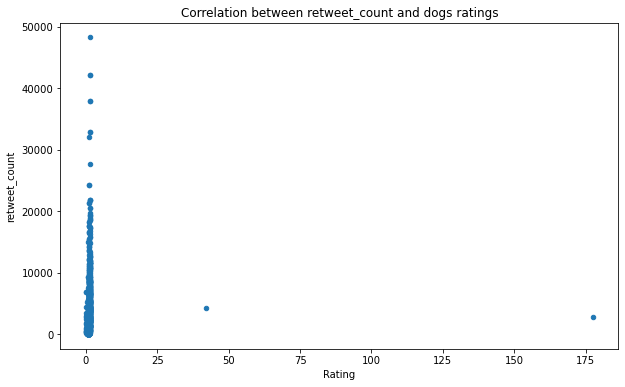

In [70]:
scatter(y='retweet_count', y_label='retweet_count',df=relationship)

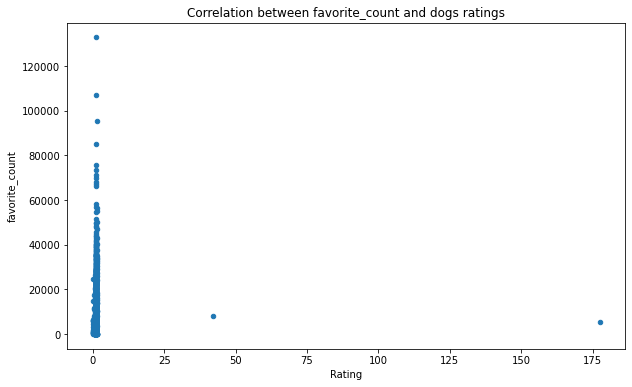

In [71]:
scatter(y='favorite_count', y_label='favorite_count',df=relationship)

I can see that there are two outliers, so I would like to check what this results would look like after removing those two outliers.

In [72]:
relationship.sort_values(['rating'],ascending=False).head()

,tweet_id,rating,retweet_count,favorite_count
810,749981277374128128,177.6,2772,5569
1758,670842764863651840,42.0,4324,7989
159,854120357044912130,1.4,8285,33911
172,851464819735769094,1.4,7855,25944
654,774314403806253056,1.4,6478,24167


In [73]:
idxs = relationship[relationship['tweet_id'].isin([749981277374128128, 670842764863651840])].index
relationship_outliers = relationship.drop(idxs, axis=0)

In [74]:
correlation_retweet_outliers = relationship_outliers['rating'].corr(relationship_outliers['retweet_count'])
correlation_retweet_outliers

0.3343736127647165

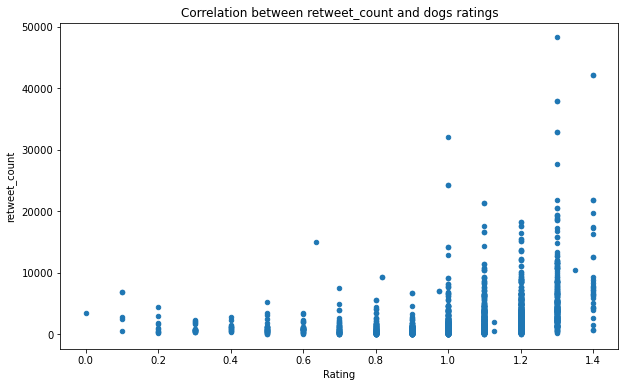

In [75]:
scatter(y='retweet_count', y_label='retweet_count',df=relationship_outliers)

In [76]:
correlation_likes_outliers = relationship_outliers['rating'].corr(relationship_outliers['favorite_count'])
correlation_likes_outliers

0.382260144975777

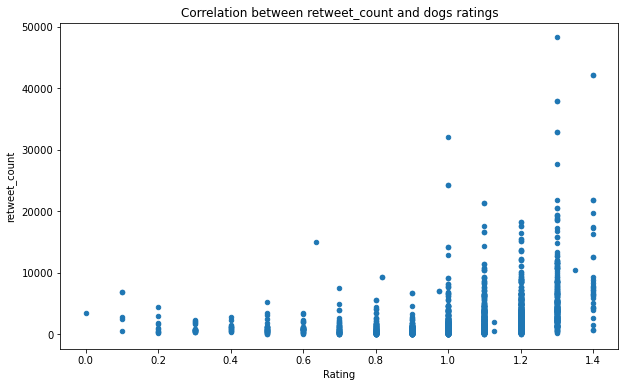

In [77]:
scatter(y='retweet_count', y_label='retweet_count',df=relationship_outliers)

After removing those outliers relationship is stronger than it was with outliers, however still it is rather weak to moderate relationship.